In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

import warnings
warnings.filterwarnings("ignore")

In [91]:
pd.set_option('display.max_columns', None)
df = pd.read_csv('hotel_bookings.csv')
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


# Data Exploration

In [95]:
print("Number of rows:", df.shape[0])
print("Number of columns:", df.shape[1])

Number of rows: 119390
Number of columns: 32


In [97]:
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [101]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [103]:
for col in df.columns:
    unique_value = df[col].unique().tolist()
    print(col, ": ",unique_value)

hotel :  ['Resort Hotel', 'City Hotel']
is_canceled :  [0, 1]
lead_time :  [342, 737, 7, 13, 14, 0, 9, 85, 75, 23, 35, 68, 18, 37, 12, 72, 127, 78, 48, 60, 77, 99, 118, 95, 96, 69, 45, 40, 15, 36, 43, 70, 16, 107, 47, 113, 90, 50, 93, 76, 3, 1, 10, 5, 17, 51, 71, 63, 62, 101, 2, 81, 368, 364, 324, 79, 21, 109, 102, 4, 98, 92, 26, 73, 115, 86, 52, 29, 30, 33, 32, 8, 100, 44, 80, 97, 64, 39, 34, 27, 82, 94, 110, 111, 84, 66, 104, 28, 258, 112, 65, 67, 55, 88, 54, 292, 83, 105, 280, 394, 24, 103, 366, 249, 22, 91, 11, 108, 106, 31, 87, 41, 304, 117, 59, 53, 58, 116, 42, 321, 38, 56, 49, 317, 6, 57, 19, 25, 315, 123, 46, 89, 61, 312, 299, 130, 74, 298, 119, 20, 286, 136, 129, 124, 327, 131, 460, 140, 114, 139, 122, 137, 126, 120, 128, 135, 150, 143, 151, 132, 125, 157, 147, 138, 156, 164, 346, 159, 160, 161, 333, 381, 149, 154, 297, 163, 314, 155, 323, 340, 356, 142, 328, 144, 336, 248, 302, 175, 344, 382, 146, 170, 166, 338, 167, 310, 148, 165, 172, 171, 145, 121, 178, 305, 173, 152, 354,

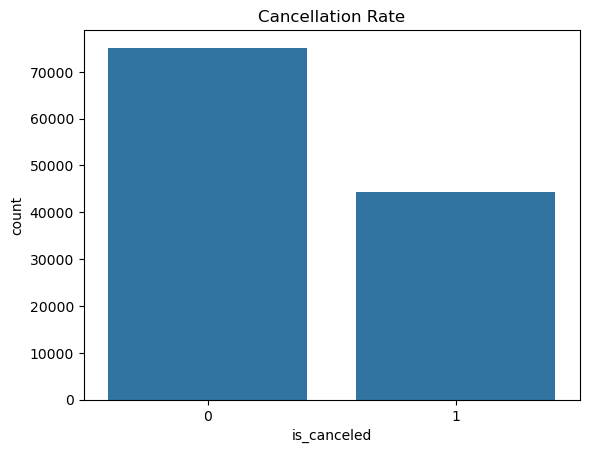

In [105]:
sns.countplot(x=df["is_canceled"])
plt.title("Cancellation Rate")
plt.show()

In [106]:
# remove extreme outliers of 5400
df = df[df['adr'] < 1000]

# Data Preprocessing

In [88]:
df.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

found four columns contain null value: country, children, agent, company

In [110]:
df['children'] = df.groupby('is_canceled')['children'].transform(lambda x: x.fillna(x.median()))

# Fill missing values for 'country' using mode, grouped by is_canceled
df['country'] = df['country'].fillna('Unknown')

# Fill missing values for 'agent' and 'company' with 0 (indicating "No agent" or "No company")
df['agent'].fillna(0, inplace=True)
df['company'].fillna(0, inplace=True)


In [112]:
# replace null value in columns (children, agent, company) with 0
# df.fillna({col: 0 for col in df.columns if col != 'country'}, inplace = True)

In [114]:
# replace null values in the "country" column with "Unknown"
# df['country'] = df['country'].fillna('Unknown')

In [116]:
sum(df.duplicated())

31994

In [118]:
# drop duplicated row
df = df.drop_duplicates()

In [120]:
print("After Preprocessing: \n")
print("Total missing value: ", df.isna().sum().sum())
print("Total duplicated rows: ", sum(df.duplicated()))

After Preprocessing: 

Total missing value:  0
Total duplicated rows:  0


In [122]:
# replace "Undefined" with "SC" in the "meal" column since they are equivalent.

df['meal'] = df['meal'].replace("Undefined", "SC")

In [124]:
# Exclude rows where all "adults", "babies", and "children" are zero at the same time.

filter = (df.children == 0) & (df.adults == 0) & (df.babies == 0)
df = df[~filter]

In [126]:
# number of data left
df.shape

(87229, 32)

In [128]:
df['reservation_status_date']= pd.to_datetime(df['reservation_status_date'])

In [130]:
cat_attributes = df.select_dtypes(['object']).columns
for col in cat_attributes:
# for col in df.columns:
    unique_value = df[col].unique().tolist()
    print(col, ": ",unique_value)

hotel :  ['Resort Hotel', 'City Hotel']
arrival_date_month :  ['July', 'August', 'September', 'October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June']
meal :  ['BB', 'FB', 'HB', 'SC']
country :  ['PRT', 'GBR', 'USA', 'ESP', 'IRL', 'FRA', 'Unknown', 'ROU', 'NOR', 'OMN', 'ARG', 'POL', 'DEU', 'BEL', 'CHE', 'CN', 'GRC', 'ITA', 'NLD', 'DNK', 'RUS', 'SWE', 'AUS', 'EST', 'CZE', 'BRA', 'FIN', 'MOZ', 'BWA', 'LUX', 'SVN', 'ALB', 'IND', 'CHN', 'MEX', 'MAR', 'UKR', 'SMR', 'LVA', 'PRI', 'SRB', 'CHL', 'AUT', 'BLR', 'LTU', 'TUR', 'ZAF', 'AGO', 'ISR', 'CYM', 'ZMB', 'CPV', 'ZWE', 'DZA', 'KOR', 'CRI', 'HUN', 'ARE', 'TUN', 'JAM', 'HRV', 'HKG', 'IRN', 'GEO', 'AND', 'GIB', 'URY', 'JEY', 'CAF', 'CYP', 'COL', 'GGY', 'KWT', 'NGA', 'MDV', 'VEN', 'SVK', 'FJI', 'KAZ', 'PAK', 'IDN', 'LBN', 'PHL', 'SEN', 'SYC', 'AZE', 'BHR', 'NZL', 'THA', 'DOM', 'MKD', 'MYS', 'ARM', 'JPN', 'LKA', 'CUB', 'CMR', 'BIH', 'MUS', 'COM', 'SUR', 'UGA', 'BGR', 'CIV', 'JOR', 'SYR', 'SGP', 'BDI', 'SAU', 'VNM

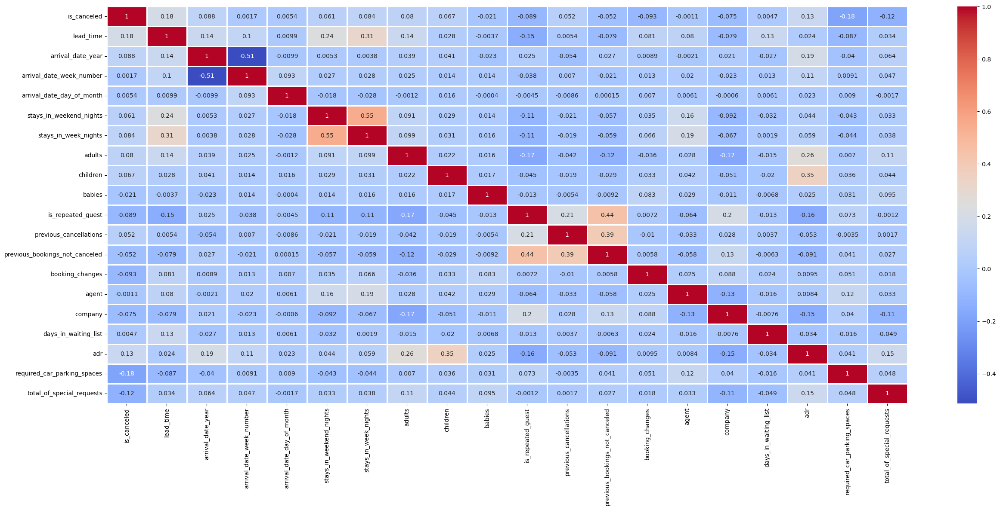

In [132]:
plt.figure(figsize = (30, 12))

# Select only numeric columns for correlation calculation
numeric_df = df.select_dtypes(include=['float64', 'int64'])

corr = numeric_df.corr()
sns.heatmap(corr, annot=True, linewidths=1, cmap='coolwarm')
plt.show()

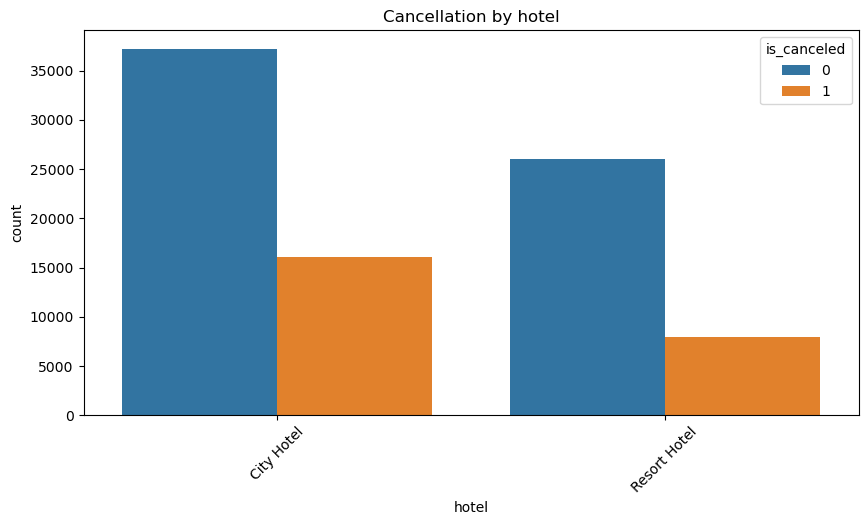

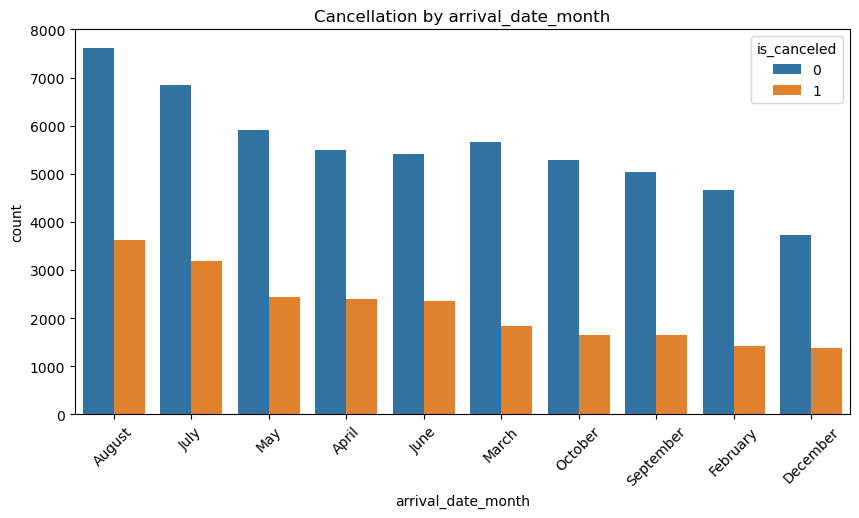

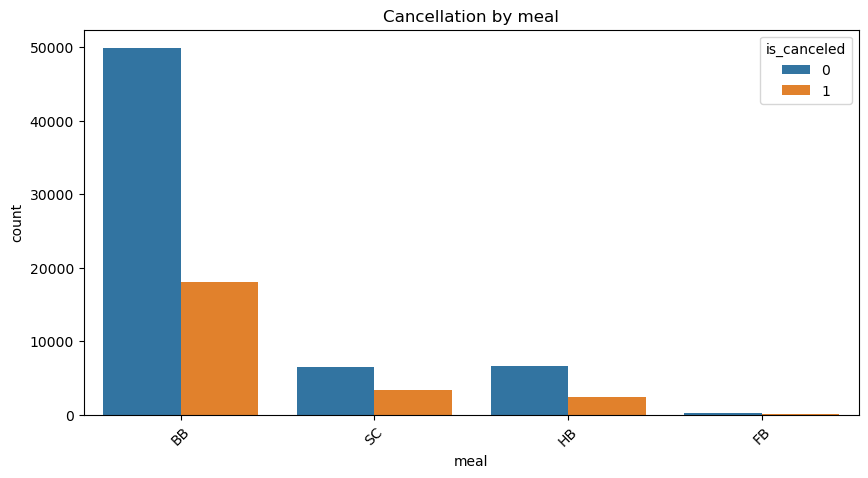

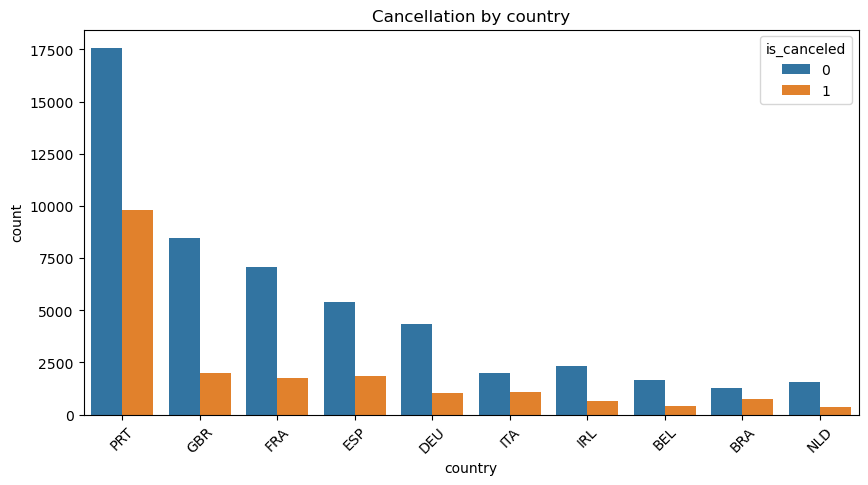

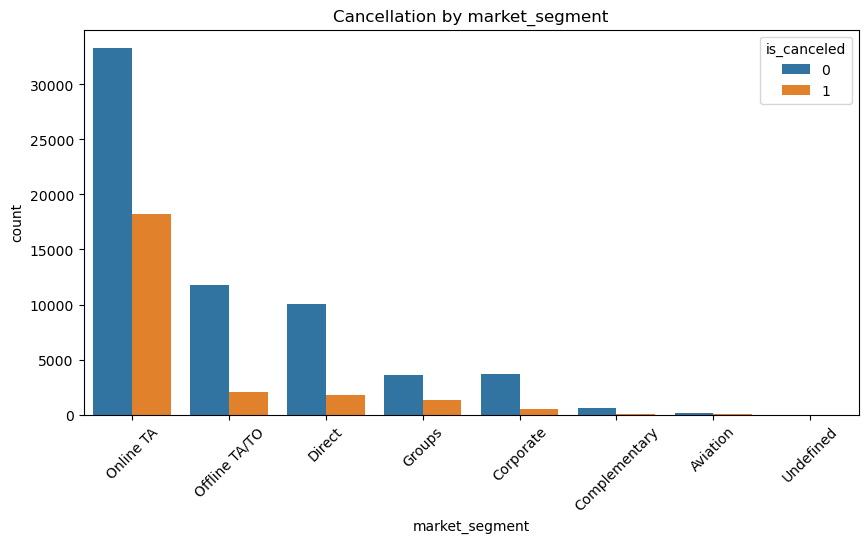

...

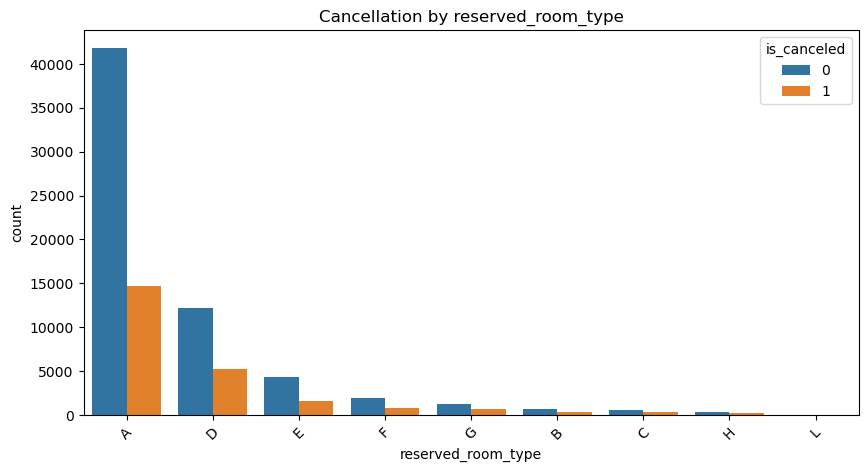

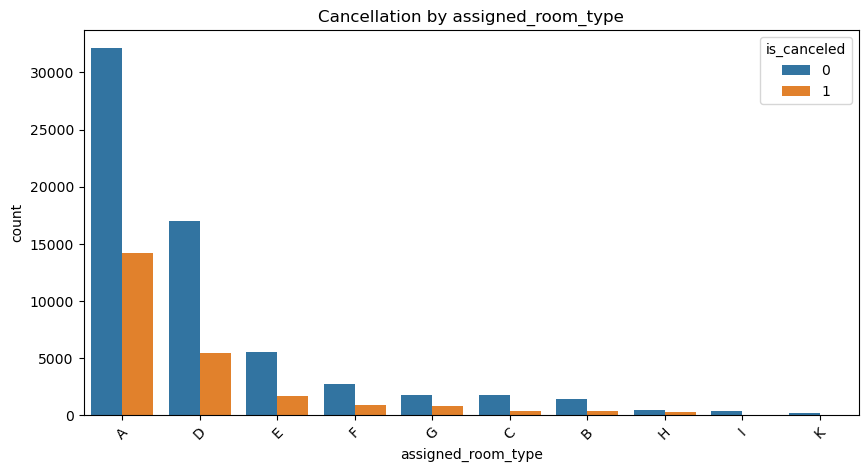

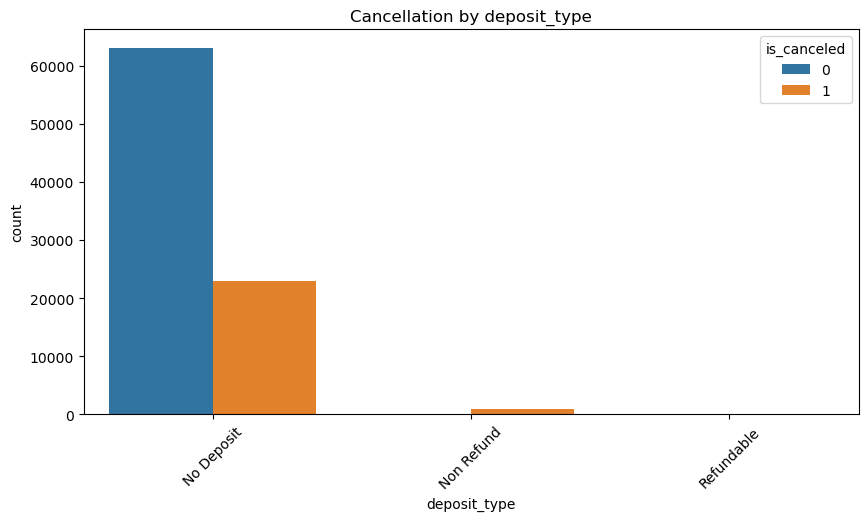

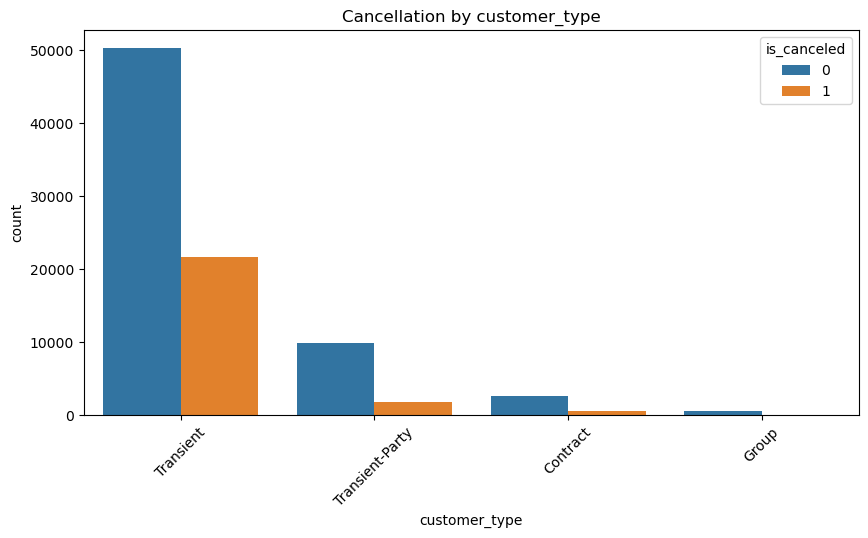

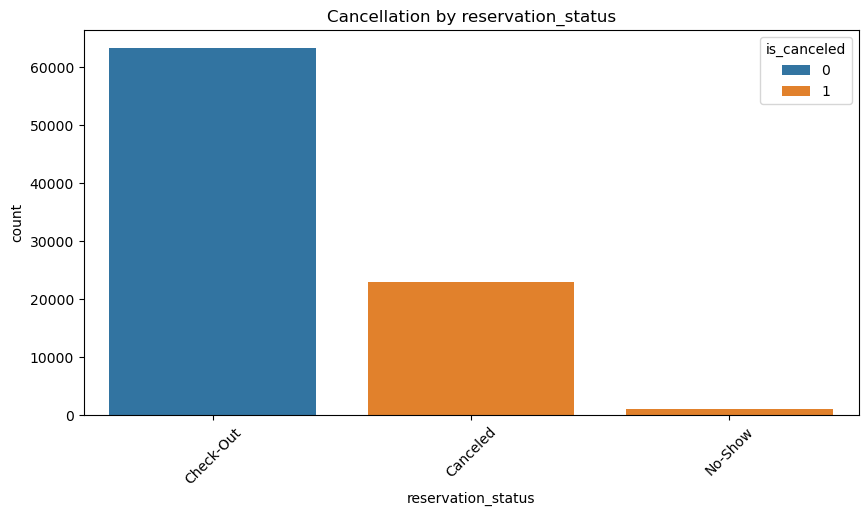

In [134]:
# Categorical Feature Analysis
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(x=df[col], hue=df["is_canceled"], order=df[col].value_counts().index[:10])  # Top 10 categories only
    plt.xticks(rotation=45)
    plt.title(f"Cancellation by {col}")
    plt.show()


# Exploratory Data Analysis (EDA)

### 1. Which countries contribute the most bookings? 

In [138]:
customer_by_country = df[df['is_canceled'] == 0]['country'].value_counts().reset_index()
customer_by_country.columns = ['Country', 'No of Customers']
customer_by_country

,Country,No of Customers
0,PRT,17573
1,GBR,8440
2,FRA,7091
3,ESP,5382
4,DEU,4332
...,...,...
161,ZMB,1
162,SYC,1
163,MDG,1
164,SMR,1


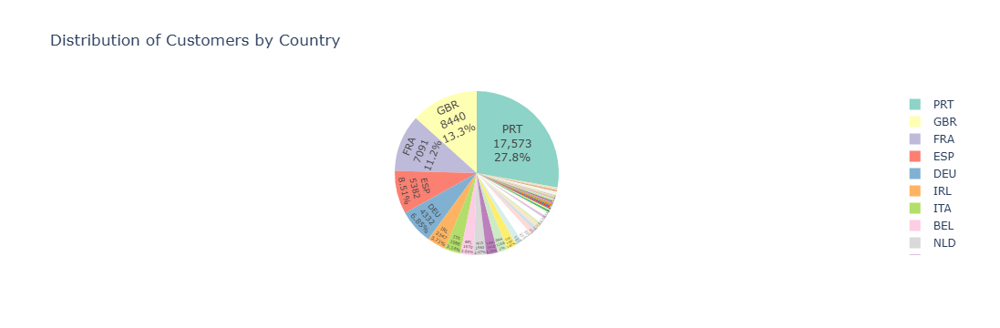

In [140]:
fig = px.pie(customer_by_country,
             values='No of Customers',
             names='Country',
             title='Distribution of Customers by Country',
             color_discrete_sequence = px.colors.qualitative.Set3)
fig.update_traces(textposition='inside', textinfo='value+percent+label')
fig.show()

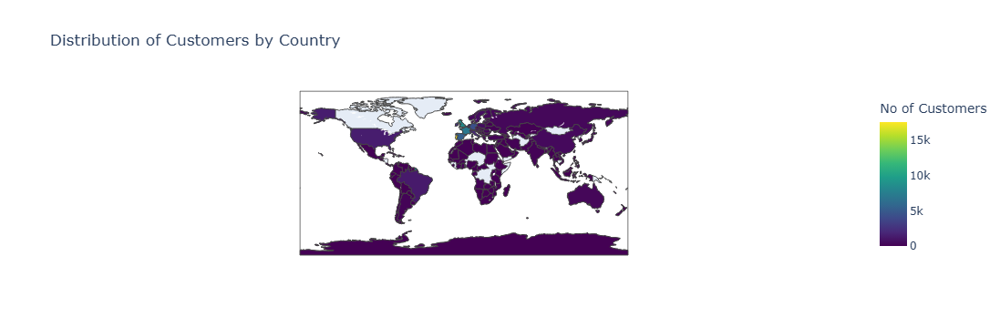

In [142]:
fig = px.choropleth(customer_by_country,
                    locations='Country', 
                    color='No of Customers',  
                    hover_name='Country',  
                    color_continuous_scale='Viridis', 
                    title='Distribution of Customers by Country')

fig.show()

Based on the data, the largest number of customers come from Portugal, followed by the United Kingdom, France, Spain, and Germany. This suggests that the majority of the customer base is concentrated in Western Europe, with Portugal being the dominant customers. 

### 2. Which months have the highest and lowest customer demand for both hotels?

In [146]:
# Count the number of records for each (year, month) combination
month_year_counts = df.groupby(['arrival_date_year', 'arrival_date_month']).size().reset_index(name='count')

# Create a pivot table to visualize missing months
pivot_table = month_year_counts.pivot(index='arrival_date_month', columns='arrival_date_year', values='count')

# Display the pivot table
display(pivot_table)

arrival_date_year,2015,2016,2017
arrival_date_month,,,
April,NaN,3767.0,4133.0
August,2447.0,4415.0,4380.0
December,1975.0,3137.0,NaN
February,NaN,2799.0,3284.0
January,NaN,1849.0,2836.0
July,1672.0,3842.0,4529.0
June,NaN,3515.0,4241.0
March,NaN,3825.0,3663.0
May,NaN,3777.0,4567.0


The dataset does not have full three-year coverage for every month:
- 2015 is missing January–June (it only has July–December).
- 2017 is missing September–December (it only has January–August).


In [149]:
# remove cancel booking 
resort_hotel = df[(df['hotel'] == 'Resort Hotel') & (df['is_canceled'] == 0)]
city_hotel = df[(df['hotel'] == 'City Hotel') & (df['is_canceled'] == 0)]

In [150]:
resort_customers = resort_hotel['arrival_date_month'].value_counts().reset_index()
resort_customers.columns=['Month','No of Customers']
resort_customers

,Month,No of Customers
0,August,3153
1,July,3013
2,May,2246
3,October,2209
4,March,2191
5,April,2169
6,February,2053
7,June,1926
8,September,1875
9,November,1744


In [151]:
city_customers = city_hotel['arrival_date_month'].value_counts().reset_index()
city_customers.columns=['Month','No of Customers']
city_customers

,Month,No of Customers
0,August,4467
1,July,3834
2,May,3656
3,June,3477
4,March,3469
5,April,3325
6,September,3166
7,October,3070
8,February,2618
9,November,2177


In [155]:
customers = resort_customers.merge(city_customers, on = 'Month')
customers.columns=['Month','No of Customers in Resort Hotel','No of Customers in City Hotel']
customers

,Month,No of Customers in Resort Hotel,No of Customers in City Hotel
0,August,3153,4467
1,July,3013,3834
2,May,2246,3656
3,October,2209,3070
4,March,2191,3469
5,April,2169,3325
6,February,2053,2618
7,June,1926,3477
8,September,1875,3166
9,November,1744,2177


In [157]:
# Identify months present in all 3 years (2015, 2016, 2017)
months_with_3_years = ["July", "August"]

# Normalize guest data
customers.loc[customers["Month"].isin(months_with_3_years), 
              ["No of Customers in Resort Hotel", "No of Customers in City Hotel"]] /= 3

customers.loc[~customers["Month"].isin(months_with_3_years), 
              ["No of Customers in Resort Hotel", "No of Customers in City Hotel"]] /= 2

In [159]:
# !pip install sort-dataframeby-monthorweek
# !pip install sorted-months-weekdays

In [161]:
import sort_dataframeby_monthorweek as sd

customers = sd.Sort_Dataframeby_Month(customers, 'Month')
customers

,Month,No of Customers in Resort Hotel,No of Customers in City Hotel
0,January,843.500000,980.5
1,February,1026.500000,1309.0
2,March,1095.500000,1734.5
3,April,1084.500000,1662.5
4,May,1123.000000,1828.0
5,June,963.000000,1738.5
6,July,1004.333333,1278.0
7,August,1051.000000,1489.0
8,September,937.500000,1583.0
9,October,1104.500000,1535.0


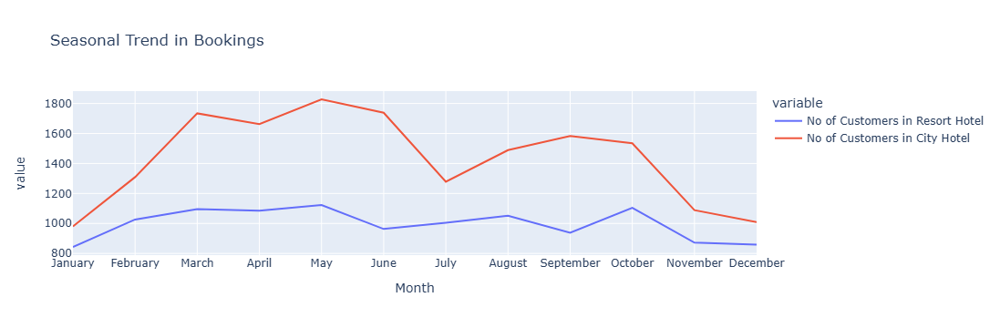

<Figure size 2000x700 with 0 Axes>

In [163]:
plt.figure(figsize = (20, 7))

px.line(customers, x = 'Month', y = ['No of Customers in Resort Hotel','No of Customers in City Hotel'],
        title = 'Seasonal Trend in Bookings')

May is the peak month for both Resort Hotels and City Hotels, suggesting strong demand for travel during spring season.(Hotel located in Portugal)

January has the lowest demand, which aligns with the winter off-peak season and post-holiday travel slump.

Resort Hotels exhibit greater seasonal variation, while City Hotels maintain a steadier  flow of customers throughout the year.

### 3. How does the booking lead time relate to the likelihood of cancellation?

In [167]:
# Create intervals for lead time
df_clean = df[['lead_time', 'is_canceled']].copy()

bins = [0, 30, 60, 90, 180, 365, 1000]  # Define your intervals
labels = ['0-30', '31-60', '61-90', '91-180', '181-365', '365+']  # Labels for intervals
df_clean['lead_time_category'] = pd.cut(df_clean['lead_time'], bins=bins, labels=labels, right=False)

# Check the data with lead time categories
df_clean.head()

,lead_time,is_canceled,lead_time_category
0,342,0,181-365
1,737,0,365+
2,7,0,0-30
3,13,0,0-30
4,14,0,0-30


In [169]:
# Print the distribution of categories and their counts
category_counts = df_clean['lead_time_category'].value_counts()
print(category_counts)

lead_time_category
0-30       33995
91-180     18315
31-60      13502
181-365    11353
61-90       9484
365+         580
Name: count, dtype: int64


In [171]:
# Group by lead_time_category and calculate the cancellation rate
cancellation_rate_by_lead_time = df_clean.groupby('lead_time_category')['is_canceled'].mean().reset_index()

# Convert to percentage
cancellation_rate_by_lead_time['Cancellation Rate (%)'] = (cancellation_rate_by_lead_time['is_canceled'] * 100).round(2)

# Display the cancellation rates by lead time category
cancellation_rate_by_lead_time


,lead_time_category,is_canceled,Cancellation Rate (%)
0,0-30,0.162083,16.21
1,31-60,0.314842,31.48
2,61-90,0.329608,32.96
3,91-180,0.348785,34.88
4,181-365,0.396195,39.62
5,365+,0.405172,40.52


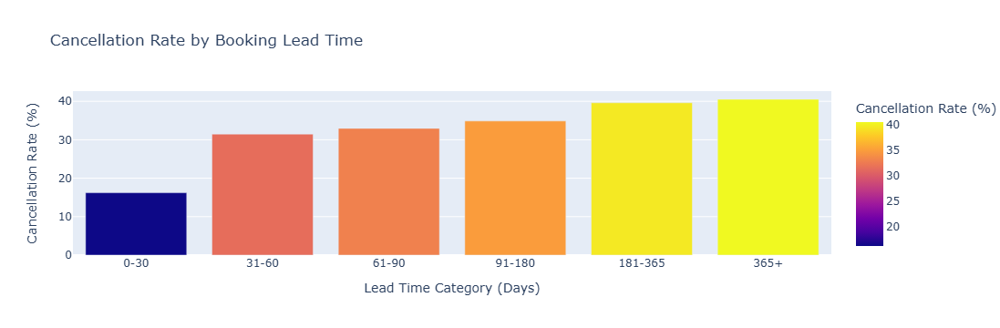

In [173]:
fig = px.bar(cancellation_rate_by_lead_time, 
             x='lead_time_category', 
             y='Cancellation Rate (%)',
             title='Cancellation Rate by Booking Lead Time',
             labels={'lead_time_category': 'Lead Time Category (Days)', 'Cancellation Rate (%)': 'Cancellation Rate (%)'},
             color='Cancellation Rate (%)') 
fig.show()

The cancellation rate tends to rise as the booking lead time increases. Notably, there is a significant jump in cancellations when moving from the 0-30 days category (16.21%) to the 31-60 days category (31.49%), indicating that bookings made further in advance are more likely to be canceled. 

While short-term bookings (0-30 days) show a relatively low cancellation rate of 16.21%, long-term bookings (365+ days) exhibit the highest cancellation rate of 40.52%, suggesting that the longer the time between booking and arrival, the more uncertainty there is, leading to a higher likelihood of cancellation.

### 4. Does ADR vary based on customer type (Contract, Group, Transient, Transient-party)?

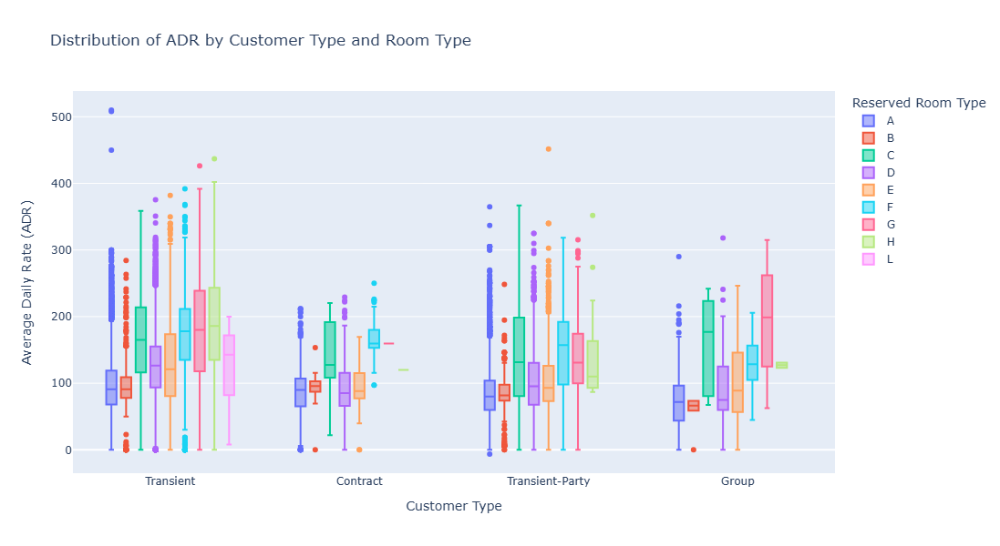

In [177]:
# Calculate ADR per person
df1 = df.copy()
df1['adr_pp'] = df1['adr'] / (df1['adults'] + df1['children'] + df1['babies'])

# Specify the desired order for room types (from A to H)
room_type_order = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']

# Create an interactive boxplot
fig = px.box(df, x="customer_type", y="adr", color="reserved_room_type",
             title="Distribution of ADR by Customer Type and Room Type",
             labels={"customer_type": "Customer Type", "adr": "Average Daily Rate (ADR)", "reserved_room_type": "Reserved Room Type"},
             category_orders={"reserved_room_type": room_type_order},
             width=900, height=600)

# Show the plot
fig.show()

ADR varies significantly by customer type:  

- **Transient customers** experience the **highest ADR and variability** due to dynamic pricing, seasonality, and demand fluctuations.  
- **Contract customers** have the **lowest and most stable ADR** with pre-negotiated rates and minimal fluctuations.  
- **Transient-Party customers** (linked to other transient bookings) have **lower ADR than Transient customers**, benefiting from group discounts, with moderate variability.  
- **Group customers** (associated with group bookings) enjoy **lower ADR** due to bulk pricing, with variability higher than Contract but lower than Transient.  

**Conclude:** Transient customers pay the most with fluctuating rates, Contract customers pay the least with fixed rates, and Transient-Party and Group customers fall in between.

**(maybe can put inside report for more details explanation)**
1. Transient Customers (Highest Variability)
Transient bookings are not part of a group or contract, meaning they likely follow a dynamic pricing model. The widest ADR distribution with many outliers suggests that prices fluctuate due to demand, seasonality, and booking conditions. This category has some of the highest ADR values, indicating that transient customers may pay a premium compared to other customer types.

2. Contract Customers (Lowest and Most Stable ADR)
Contract bookings have pre-negotiated rates, leading to low ADR variability. The tight box plots confirm that these customers pay consistent rates, likely influenced by long-term agreements rather than short-term market fluctuations.This category has the lowest median ADR, which aligns with expectations since contracts often secure lower, fixed prices.

3. Transient-Party Customers (Moderate ADR, Some Variation)
These bookings are similar to Transient bookings but linked to at least one other transient booking (e.g., families or small groups). ADR is lower than standalone Transient customers, likely due to group discounts or multi-room bookings. The distribution shows some ADR variability, but it is less extreme than Transient customers.

4. Group Customers (Lower ADR, Moderate Stability)
These bookings are associated with a group, which often comes with discounted pricing. ADR is lower than Transient and Transient-Party customers, suggesting bulk pricing or negotiated rates for events and large bookings. The variability is higher than Contract customers, possibly due to different types of group deals and booking conditions.

### 5. What is the relationship between the number of children or babies and the type of room reserved?

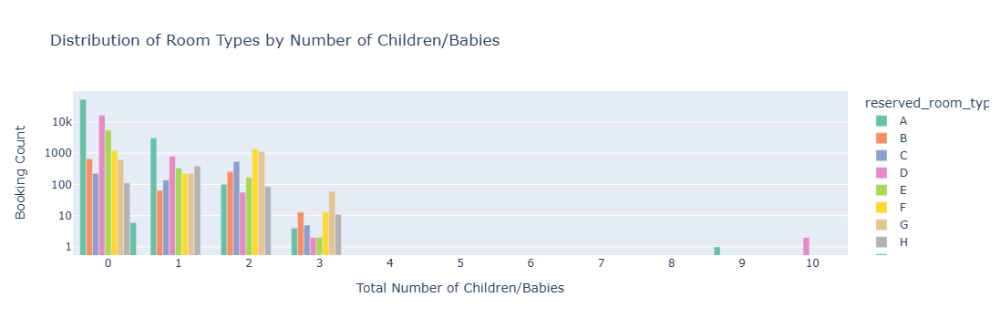

In [182]:
# Create a new column for the total number of children (including babies)
df2 = df.copy()
df2['total_children'] = df2['children'] + df2['babies']

# Group by total children and reserved room type, count the occurrences
room_type_by_children = df2.groupby(['total_children', 'reserved_room_type']).size().reset_index(name='count')

fig = px.bar(room_type_by_children, x='total_children', y='count', color='reserved_room_type',
             title="Distribution of Room Types by Number of Children/Babies",
             labels={'total_children': 'Total Number of Children/Babies', 'count': 'Booking Count'},
             category_orders={'reserved_room_type': sorted(df2['reserved_room_type'].unique())},
             barmode='group',
             color_discrete_sequence = px.colors.qualitative.Set2)


fig.update_layout(yaxis_type='log')  # Set y-axis to log scale

# Update x-axis to display each number as a tick (if needed)
fig.update_layout(
    xaxis=dict(
        tickmode='array',  # Display each tick
        tickvals=list(range(0, 11))  # Display ticks from 1 to 10
    )
)

fig.show()


Most bookings are for families with 0-2 children, with a diverse selection of room types. As the number of children increases, bookings decrease, and room choices become limited. Large families (3+ children) have fewer options, with only a few room types available. 

### 6. What is the cancellation rate for each hotel (Resort vs. City)?

          hotel  cancellation_rate
0    City Hotel           0.300978
1  Resort Hotel           0.234833


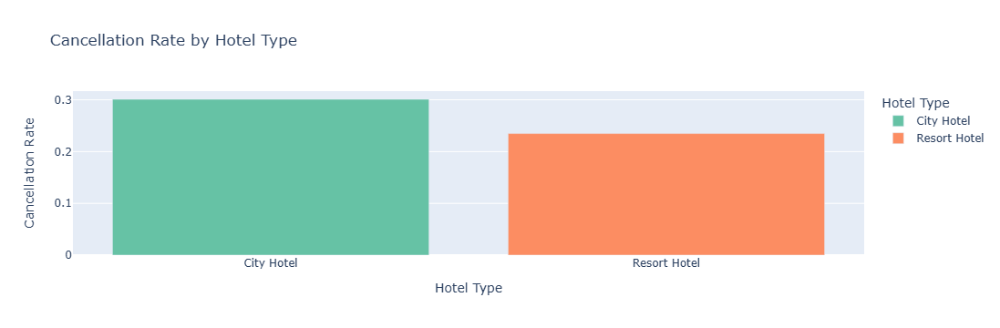

In [186]:
# Calculate the cancellation rate for each hotel type
cancellation_rate_by_hotel = df.groupby('hotel')['is_canceled'].mean().reset_index()

# Rename the column to make it more descriptive
cancellation_rate_by_hotel.rename(columns={'is_canceled': 'cancellation_rate'}, inplace=True)

# Show the result
print(cancellation_rate_by_hotel)

# Optional: Plot the cancellation rate for each hotel type
import plotly.express as px

fig = px.bar(cancellation_rate_by_hotel, 
             x='hotel', 
             y='cancellation_rate', 
             title='Cancellation Rate by Hotel Type',
             labels={'hotel': 'Hotel Type', 'cancellation_rate': 'Cancellation Rate'},
             color='hotel', 
             color_discrete_sequence=px.colors.qualitative.Set2)

# Show the plot
fig.show()

City Hotels have a higher cancellation rate (30.1%) compared to Resort Hotels (23.5%). This means that customers booking City Hotels are more likely to cancel their bookings than customers booking Resort Hotels.

### 7. How does the cancellation percentage vary between Resort Hotels and City Hotels across different months?

,Month,Resort Hotel,City Hotel
4,January,13.972463,28.010279
3,February,17.616372,27.095517
7,March,17.507530,28.207781
0,April,23.302687,34.444006
8,May,23.657376,32.321362
6,June,30.192099,30.418251
5,July,30.141433,33.089005
1,August,32.426061,32.071168
11,September,23.469388,25.189036
10,October,18.906021,26.852514


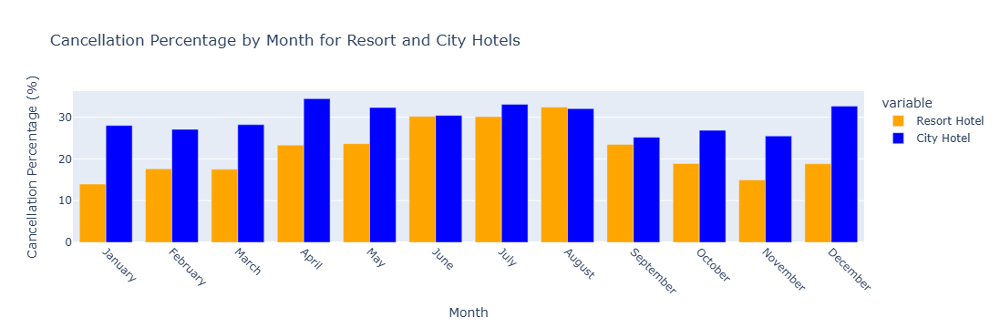

In [190]:
# Separate data by hotel type
resort_data = df[df['hotel'] == 'Resort Hotel']
city_data = df[df['hotel'] == 'City Hotel']

# Group by arrival_date_month and calculate the total bookings and cancellations for each hotel type
resort_total_bookings = resort_data.groupby('arrival_date_month')['hotel'].count()
resort_cancellations = resort_data.groupby('arrival_date_month')['is_canceled'].sum()

city_total_bookings = city_data.groupby('arrival_date_month')['hotel'].count()
city_cancellations = city_data.groupby('arrival_date_month')['is_canceled'].sum()

# Calculate cancellation percentage
resort_cancellation_percentage = (resort_cancellations / resort_total_bookings) * 100
city_cancellation_percentage = (city_cancellations / city_total_bookings) * 100

# Combine both hotel types' cancellation percentage data for comparison
combined_percentage = pd.DataFrame({
    'Month': resort_cancellation_percentage.index,
    'Resort Hotel': resort_cancellation_percentage.values,
    'City Hotel': city_cancellation_percentage.values
})

# Define the correct order of months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
               'September', 'October', 'November', 'December']

# Reorder the combined_percentage DataFrame by the correct month order
combined_percentage['Month'] = pd.Categorical(combined_percentage['Month'], categories=month_order, ordered=True)
combined_percentage = combined_percentage.sort_values('Month')

display(combined_percentage)

# Plotting with Plotly Express
fig = px.bar(combined_percentage, 
             x='Month', 
             y=['Resort Hotel', 'City Hotel'], 
             title="Cancellation Percentage by Month for Resort and City Hotels", 
             labels={'value': 'Cancellation Percentage (%)', 'Month': 'Month'},
             barmode='group', 
             color_discrete_sequence=['orange', 'blue'])

# Show the plot
fig.update_xaxes(tickangle=45)  # Rotate x-axis labels for better visibility
fig.show()

,Month,Resort Hotel,City Hotel
4,January,27.944926,28.010279
3,February,35.232745,27.095517
7,March,35.015060,28.207781
0,April,46.605375,34.444006
8,May,47.314752,32.321362
6,June,60.384197,30.418251
5,July,90.424299,33.089005
1,August,97.278183,32.071168
11,September,46.938776,25.189036
10,October,37.812041,26.852514


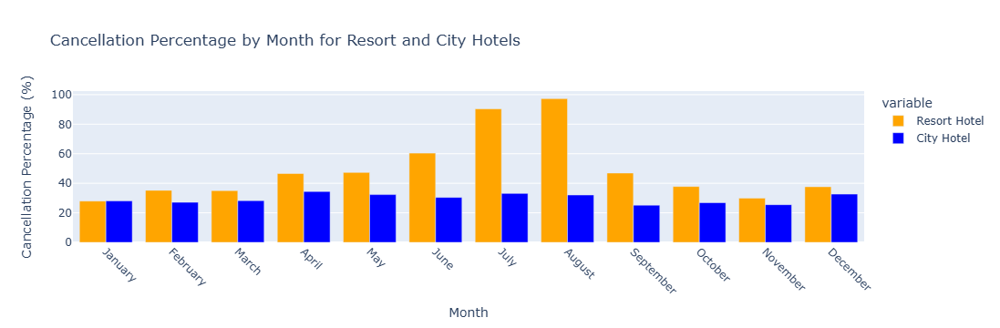

In [191]:
# Separate data by hotel type
resort_data = df[df['hotel'] == 'Resort Hotel']
city_data = df[df['hotel'] == 'City Hotel']

# Group by arrival_date_month and calculate the total bookings and cancellations for each hotel type
resort_total_bookings = resort_data.groupby('arrival_date_month')['hotel'].count()
resort_cancellations = resort_data.groupby('arrival_date_month')['is_canceled'].sum()

city_total_bookings = city_data.groupby('arrival_date_month')['hotel'].count()
city_cancellations = city_data.groupby('arrival_date_month')['is_canceled'].sum()

# Count the available years for each month
years_count_resort = resort_data.groupby('arrival_date_month')['arrival_date_year'].nunique()
years_count_city = city_data.groupby('arrival_date_month')['arrival_date_year'].nunique()

# Normalize by the number of years available
resort_total_bookings = resort_total_bookings / years_count_resort
resort_cancellation = resort_cancellations / years_count_resort

city_total_bookings = city_total_bookings / years_count_city
city_cancellations = city_cancellations / years_count_city

# Calculate cancellation percentage
resort_cancellation_percentage = (resort_cancellations / resort_total_bookings) * 100
city_cancellation_percentage = (city_cancellations / city_total_bookings) * 100

# Combine both hotel types' cancellation percentage data for comparison
combined_percentage = pd.DataFrame({
    'Month': resort_cancellation_percentage.index,
    'Resort Hotel': resort_cancellation_percentage.values,
    'City Hotel': city_cancellation_percentage.values
})

# Define the correct order of months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
               'September', 'October', 'November', 'December']

# Reorder the combined_percentage DataFrame by the correct month order
combined_percentage['Month'] = pd.Categorical(combined_percentage['Month'], categories=month_order, ordered=True)
combined_percentage = combined_percentage.sort_values('Month')

display(combined_percentage)

# Plotting with Plotly Express
fig = px.bar(combined_percentage, 
             x='Month', 
             y=['Resort Hotel', 'City Hotel'], 
             title="Cancellation Percentage by Month for Resort and City Hotels", 
             labels={'value': 'Cancellation Percentage (%)', 'Month': 'Month'},
             barmode='group', 
             color_discrete_sequence=['orange', 'blue'])

# Show the plot
fig.update_xaxes(tickangle=45)  # Rotate x-axis labels for better visibility
fig.show()


City Hotels have higher cancellation rates than Resort Hotels throughout the year. City Hotels have a higher cancellation rate (30.1%) compared to Resort Hotels (23.5%).

Summer months (June–August) show high cancellations for both hotel types, likely due to increased tourist activity and last-minute changes. 

### 8. How Does Deposit Type Affect the Cancellation Rate?

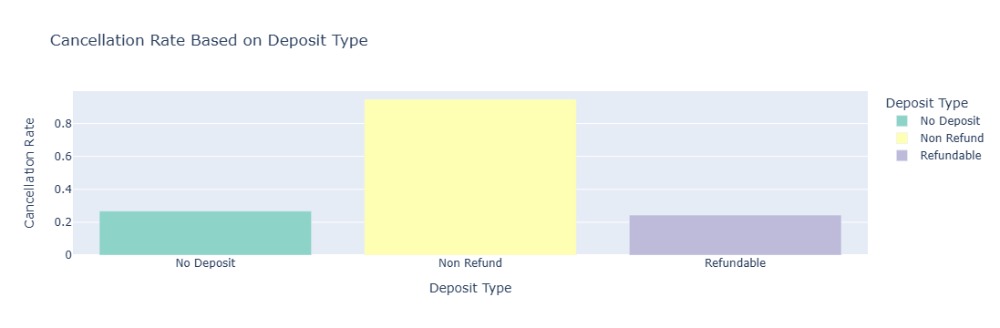

In [196]:
cancel_rate_by_deposit = df.groupby('deposit_type')['is_canceled'].mean().reset_index()

# Rename columns for clarity
cancel_rate_by_deposit.columns = ['Deposit Type', 'Cancellation Rate']

# Create the bar plot using Plotly Express
fig = px.bar(cancel_rate_by_deposit, 
             x='Deposit Type', 
             y='Cancellation Rate', 
             title='Cancellation Rate Based on Deposit Type', 
             labels={'Deposit Type': 'Deposit Type', 'Cancellation Rate': 'Cancellation Rate'},
             color='Deposit Type', 
             color_discrete_sequence=px.colors.qualitative.Set3)

# Show the plot
fig.show()

Surprisingly, non-refundable bookings have the highest cancellation rate. This could indicate that customers are still willing to cancel despite the financial risk of losing their payment. It suggests that factors such as changing travel plans, unexpected circumstances, or dissatisfaction with rigid cancellation policies may be driving this high rate.

No Deposit and Refundable Deposits exhibit a more balanced approach, with lower cancellation rates, suggesting that customers are more likely to commit to bookings when they have the flexibility to cancel or change plans.

# Data Preparation

#### 1. Data Splitting

In [207]:
from sklearn.model_selection import train_test_split

X = df.drop(["is_canceled"], axis=1)
y = df["is_canceled"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#### 2. Feature Selection

In [209]:
numerical_train = X_train.select_dtypes(include=['int64', 'float64'])
correlation = numerical_train.corrwith(y_train).abs().sort_values(ascending=False)
display(correlation)


required_car_parking_spaces       0.184530
lead_time                         0.183493
adr                               0.133586
total_of_special_requests         0.118146
booking_changes                   0.096097
arrival_date_year                 0.088637
is_repeated_guest                 0.088555
stays_in_week_nights              0.083416
adults                            0.080655
company                           0.074460
children                          0.072163
stays_in_weekend_nights           0.060111
previous_bookings_not_canceled    0.051917
previous_cancellations            0.047895
babies                            0.019566
arrival_date_day_of_month         0.005850
days_in_waiting_list              0.004868
arrival_date_week_number          0.003515
agent                             0.000152
dtype: float64

In [213]:
from sklearn.feature_selection import SelectKBest, chi2
import pandas as pd

# Select categorical features
categorical_df = df.select_dtypes(include=['object'])

# Convert categorical variables to numeric using One-Hot Encoding
categorical_encoded = pd.get_dummies(categorical_df)

# Apply SelectKBest with Chi-Square test
k = 10  # Choose the number of top features you want to keep
selector = SelectKBest(score_func=chi2, k=k)
X_new = selector.fit_transform(categorical_encoded, df["is_canceled"])

# Get selected feature names
selected_features = categorical_encoded.columns[selector.get_support()]

# Print selected features
print("Top {} selected features based on Chi-Square test:".format(k))
print(selected_features.tolist())

Top 10 selected features based on Chi-Square test:
['country_PRT', 'market_segment_Direct', 'market_segment_Offline TA/TO', 'market_segment_Online TA', 'distribution_channel_Direct', 'deposit_type_Non Refund', 'customer_type_Transient-Party', 'reservation_status_Canceled', 'reservation_status_Check-Out', 'reservation_status_No-Show']


In [215]:
# (Label Encoding is not suitable for Chi-Square???)
# import pandas as pd
# from sklearn.preprocessing import LabelEncoder
# from sklearn.feature_selection import SelectKBest, chi2

# # Select categorical features
# categorical_df = df.select_dtypes(include=['object']).copy()

# # Apply Label Encoding to categorical features
# label_encoders = {}
# for col in categorical_df.columns:
#     le = LabelEncoder()
#     categorical_df[col] = le.fit_transform(categorical_df[col])
#     label_encoders[col] = le  # Store encoders if needed later for inverse transform

# # Apply SelectKBest with Chi-Square test
# k = 10  # Choose the number of top features to keep
# selector = SelectKBest(score_func=chi2, k=k)
# X_new = selector.fit_transform(categorical_df, df["is_canceled"])

# # Get selected feature names
# selected_features = categorical_df.columns[selector.get_support()]

# # Print selected features
# print(f"Top {k} selected features based on Chi-Square test:")
# print(selected_features.tolist())

Top 10 selected features based on Chi-Square test:
['hotel', 'arrival_date_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'reservation_status']


In [46]:
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler

categorical_df =df.select_dtypes(include=['object'])

# Convert categorical variables to numeric using one-hot encoding
categorical_encoded = pd.get_dummies(categorical_df)

# Normalize the data (Chi-Square requires non-negative values)
scaler = MinMaxScaler()
categorical_encoded_scaled = scaler.fit_transform(categorical_encoded)

# Apply Chi-Square test
chi_scores, p_values = chi2(categorical_encoded, df["is_canceled"])

# Create a DataFrame with scores
chi2_results = pd.DataFrame({"Feature": categorical_encoded.columns, "Chi2 Score": chi_scores,"p-value": p_values})

# Sort by p-value (ascending order)
chi2_results = chi2_results.sort_values(by="p-value", ascending=True)

# Display the features with p-value >= 0.05 (remove these)
non_significant_features = chi2_results[chi2_results["p-value"] >= 0.05]

print("Features with p-value >= 0.05 (Remove these):")

# Display the list of non-significant feature names
non_significant_feature_list = non_significant_features["Feature"].tolist()

# Print the list of non-significant features
print(non_significant_feature_list)

Features with p-value >= 0.05 (Remove these):
['country_CMR', 'country_ZAF', 'country_LVA', 'country_THA', 'country_DOM', 'country_PAN', 'country_LBY', 'country_CUB', 'country_DNK', 'country_MYS', 'country_TZA', 'country_VGB', 'country_HND', 'country_UMI', 'country_KHM', 'country_GLP', 'country_NIC', 'assigned_room_type_L', 'country_FJI', 'country_FRO', 'country_JAM', 'country_LKA', 'country_HUN', 'country_AUS', 'country_ISL', 'country_CAF', 'country_SUR', 'country_PRI', 'country_PRY', 'meal_HB', 'country_JOR', 'country_SGP', 'country_CYP', 'country_GNB', 'country_VEN', 'country_COL', 'country_GTM', 'country_BOL', 'country_SYR', 'country_SVK', 'country_GHA', 'country_GAB', 'country_UZB', 'country_ZWE', 'country_SVN', 'country_IND', 'country_EST', 'arrival_date_month_December', 'country_KWT', 'country_ATA', 'country_UGA', 'country_STP', 'country_TGO', 'country_SLV', 'country_LAO', 'country_RWA', 'country_BRB', 'country_ABW', 'country_MWI', 'country_COM', 'country_KNA', 'country_CZE', 'c

In [221]:
import pandas as pd
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler

# Select categorical features
categorical_df = df.select_dtypes(include=['object'])

# Convert categorical variables to numeric using One-Hot Encoding
categorical_encoded = pd.get_dummies(categorical_df)

# Normalize the data (Chi-Square requires non-negative values)
scaler = MinMaxScaler()
categorical_encoded_scaled = scaler.fit_transform(categorical_encoded)

# Apply Chi-Square test
chi_scores, p_values = chi2(categorical_encoded_scaled, df["is_canceled"])

# Create a DataFrame with feature names, scores, and p-values
chi2_results = pd.DataFrame({"Feature": categorical_encoded.columns, "Chi2 Score": chi_scores, "p-value": p_values})

# Sort features by Chi-Square score (descending) for importance
chi2_results_sorted = chi2_results.sort_values(by="Chi2 Score", ascending=False)

# Display top 10 features
top_k = 10  # Select the top 10 most important categorical features
top_features = chi2_results_sorted.head(top_k)

print(f"Top {top_k} categorical features based on Chi-Square test:")
print(top_features)

# Display non-significant features (optional)
non_significant_features = chi2_results_sorted[chi2_results_sorted["p-value"] >= 0.05]
print("\nFeatures with p-value >= 0.05 (Consider Removing):")
print(non_significant_features["Feature"].tolist())


Top 10 categorical features based on Chi-Square test:
                           Feature    Chi2 Score        p-value
236    reservation_status_Canceled  60553.436146   0.000000e+00
237   reservation_status_Check-Out  24008.000000   0.000000e+00
238     reservation_status_No-Show   2667.563854   0.000000e+00
230        deposit_type_Non Refund   2345.720917   0.000000e+00
202       market_segment_Online TA   1597.434323   0.000000e+00
201   market_segment_Offline TA/TO   1117.089142  6.377981e-245
205    distribution_channel_Direct   1043.802032  5.413579e-229
199          market_segment_Direct    964.162113  1.107320e-211
153                    country_PRT    929.743651  3.357562e-204
235  customer_type_Transient-Party    882.896554  5.127951e-194

Features with p-value >= 0.05 (Consider Removing):
['country_CMR', 'country_ZAF', 'country_LVA', 'country_THA', 'country_DOM', 'country_LBY', 'country_CUB', 'country_PAN', 'country_DNK', 'country_MYS', 'country_TZA', 'country_GLP', 'country_

In [219]:
# remove useless columns
drop_col = ['reservation_status', 'reservation_status_date', 'booking_changes', # leaking feature
            'country']

X_train = X_train.drop(columns=drop_col, errors='ignore')
X_test = X_test.drop(columns=drop_col, errors='ignore')

#### 3. Apply SMOTENC + normalization

is_canceled
0    50577
1    19206
Name: count, dtype: int64


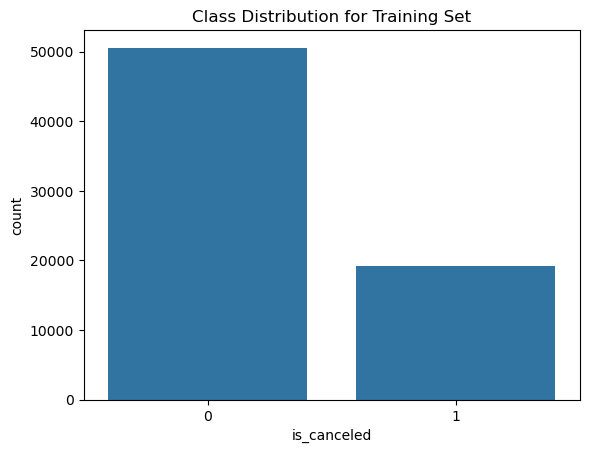

is_canceled
0    12644
1     4802
Name: count, dtype: int64


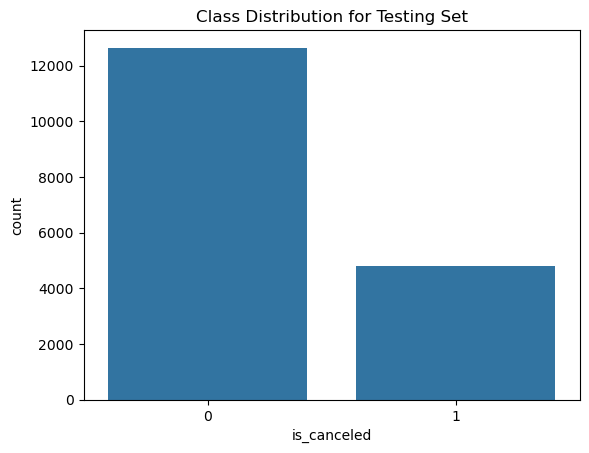

In [48]:
print(y_train.value_counts())
plt.figure()
sns.countplot(x='is_canceled', data = pd.DataFrame({'is_canceled':y_train}))
plt.title('Class Distribution for Training Set')
plt.show()

print(y_test.value_counts())
plt.figure()
sns.countplot(x='is_canceled', data = pd.DataFrame({'is_canceled':y_test}))
plt.title('Class Distribution for Testing Set')
plt.show()

In [49]:
cat_features = X_train.select_dtypes(include=['object']).columns
cat_index = [X_train.columns.get_loc(col) for col in cat_features] 
print(cat_index)

[0, 3, 11, 12, 13, 17, 18, 19, 23]


In [50]:
# normalize numerical attributes
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()
X_train_preprocess = X_train.copy()
num_attributes = X_train.select_dtypes(['int64','float64']).columns
X_train_preprocess[num_attributes] = min_max_scaler.fit_transform(X_train_preprocess[num_attributes])

display(X_train_preprocess)

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reserved_room_type,assigned_room_type,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
36496,Resort Hotel,0.446404,1.0,May,0.326923,0.133333,0.333333,0.285714,0.04,0.0,...,D,D,No Deposit,0.448598,0.0,0.0,Transient,0.143073,0.0,0.2
20816,Resort Hotel,0.002714,0.5,February,0.096154,0.066667,0.111111,0.119048,0.02,0.0,...,D,D,No Deposit,0.448598,0.0,0.0,Transient,0.107247,0.0,0.2
114158,City Hotel,0.156038,1.0,June,0.442308,0.333333,0.111111,0.119048,0.04,0.0,...,A,A,No Deposit,0.052336,0.0,0.0,Transient,0.184903,0.0,0.0
83572,City Hotel,0.001357,0.5,February,0.096154,0.133333,0.000000,0.047619,0.04,0.0,...,A,A,No Deposit,0.016822,0.0,0.0,Transient,0.190519,0.0,0.0
6876,Resort Hotel,0.153324,0.5,July,0.519231,0.233333,0.111111,0.119048,0.04,0.0,...,E,E,No Deposit,0.000000,0.0,0.0,Transient,0.380301,0.0,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112498,City Hotel,0.001357,1.0,May,0.384615,0.766667,0.000000,0.023810,0.04,0.0,...,A,A,No Deposit,0.016822,0.0,0.0,Transient,0.322205,0.0,0.0
36628,Resort Hotel,0.023066,1.0,May,0.384615,0.766667,0.000000,0.023810,0.04,0.0,...,A,D,No Deposit,0.448598,0.0,0.0,Transient,0.176963,0.0,0.4
10151,Resort Hotel,0.048847,1.0,February,0.115385,0.533333,0.000000,0.047619,0.04,0.0,...,A,C,No Deposit,0.448598,0.0,0.0,Transient,0.105310,0.0,0.2
42222,City Hotel,0.002714,0.0,September,0.673077,0.066667,0.000000,0.047619,0.04,0.0,...,A,A,No Deposit,0.016822,0.0,0.0,Contract,0.270886,0.0,0.4


In [51]:
from imblearn.over_sampling import SMOTENC

ovr_samp = SMOTENC(random_state=0, categorical_features=cat_index)
X_ovr_samp, y_ovr_samp=ovr_samp.fit_resample(X_train_preprocess, y_train)
X_ovr_samp = pd.DataFrame(data=X_ovr_samp,columns=X_train_preprocess.columns)

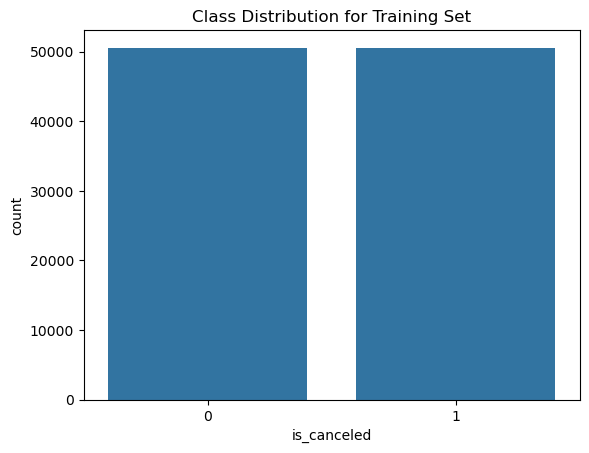

In [52]:
plt.figure()
sns.countplot(x='is_canceled', data = pd.DataFrame(data=y_ovr_samp,columns=['is_canceled']))
plt.title('Class Distribution for Training Set')
plt.show()

In [53]:
display(X_ovr_samp)

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reserved_room_type,assigned_room_type,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,Resort Hotel,0.446404,1.0,May,0.326923,0.133333,0.333333,0.285714,0.040000,0.0,...,D,D,No Deposit,0.448598,0.0,0.0,Transient,0.143073,0.0,0.2
1,Resort Hotel,0.002714,0.5,February,0.096154,0.066667,0.111111,0.119048,0.020000,0.0,...,D,D,No Deposit,0.448598,0.0,0.0,Transient,0.107247,0.0,0.2
2,City Hotel,0.156038,1.0,June,0.442308,0.333333,0.111111,0.119048,0.040000,0.0,...,A,A,No Deposit,0.052336,0.0,0.0,Transient,0.184903,0.0,0.0
3,City Hotel,0.001357,0.5,February,0.096154,0.133333,0.000000,0.047619,0.040000,0.0,...,A,A,No Deposit,0.016822,0.0,0.0,Transient,0.190519,0.0,0.0
4,Resort Hotel,0.153324,0.5,July,0.519231,0.233333,0.111111,0.119048,0.040000,0.0,...,E,E,No Deposit,0.000000,0.0,0.0,Transient,0.380301,0.0,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101149,City Hotel,0.089522,1.0,March,0.230769,0.966667,0.000000,0.042206,0.032274,0.0,...,A,A,No Deposit,0.016822,0.0,0.0,Transient,0.198793,0.0,0.0
101150,Resort Hotel,0.100407,0.0,September,0.673077,0.133333,0.111111,0.096329,0.040000,0.0,...,D,D,No Deposit,0.448598,0.0,0.0,Transient,0.287509,0.0,0.0
101151,Resort Hotel,0.153253,0.0,September,0.867411,0.815789,0.315786,0.324559,0.020000,0.0,...,A,A,No Deposit,0.505065,0.0,0.0,Transient,0.081888,0.0,0.0
101152,City Hotel,0.212591,0.5,July,0.557692,0.557720,0.055556,0.052257,0.040000,0.0,...,A,A,No Deposit,0.016822,0.0,0.0,Transient,0.181900,0.0,0.2


#### 4. One Hot Encoding

In [54]:
# apply one hot encoding

X_train_rows = len(X_ovr_samp) # save the number of rows of training data
X_train_test = pd.concat(objs=[X_ovr_samp, X_test], axis=0) # concatenate the training and testing attributes
X_train_test_onehot = pd.get_dummies(X_train_test, columns=cat_features) #convert categorical attributes to one hot encoding format

# split the training and testing attributes back into individual variables
X_train_onehot = X_train_test_onehot[:X_train_rows]
X_test_onehot = X_train_test_onehot[X_train_rows:]


In [55]:
# normalise test data

X_test_preprocess = X_test_onehot.copy()
X_test_preprocess[num_attributes] = min_max_scaler.transform(X_test_preprocess[num_attributes]) 

# Model Training

In [56]:
X_train = X_train_onehot
y_train = y_ovr_samp
X_test = X_test_preprocess

In [57]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [58]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)

acc_lr = accuracy_score(y_test, y_pred_lr)
conf = confusion_matrix(y_test, y_pred_lr)
clf_report = classification_report(y_test, y_pred_lr)

print(f"Accuracy Score of Logistic Regression is : {acc_lr}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Logistic Regression is : 0.7064656654820589
Confusion Matrix : 
[[8771 3873]
 [1248 3554]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.88      0.69      0.77     12644
           1       0.48      0.74      0.58      4802

    accuracy                           0.71     17446
   macro avg       0.68      0.72      0.68     17446
weighted avg       0.77      0.71      0.72     17446



In [59]:
# only using the numerical attributes to "train" the knn model

from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
knn.fit(X_train[num_attributes], y_train)

y_pred_knn = knn.predict(X_test[num_attributes])

acc_knn = accuracy_score(y_test, y_pred_knn)
conf = confusion_matrix(y_test, y_pred_knn)
clf_report = classification_report(y_test, y_pred_knn)

print(f"Accuracy Score of KNN is : {acc_knn}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of KNN is : 0.6837670526195117
Confusion Matrix : 
[[8594 4050]
 [1467 3335]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.85      0.68      0.76     12644
           1       0.45      0.69      0.55      4802

    accuracy                           0.68     17446
   macro avg       0.65      0.69      0.65     17446
weighted avg       0.74      0.68      0.70     17446



In [60]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X_train[num_attributes], y_train)

y_pred_gnb = gnb.predict(X_test[num_attributes])

acc_gnb = accuracy_score(y_test, y_pred_gnb)
conf = confusion_matrix(y_test, y_pred_gnb)
clf_report = classification_report(y_test, y_pred_gnb)

print(f"Accuracy Score of Decision Tree is : {acc_gnb}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Decision Tree is : 0.4040467728992319
Confusion Matrix : 
[[ 2362 10282]
 [  115  4687]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.95      0.19      0.31     12644
           1       0.31      0.98      0.47      4802

    accuracy                           0.40     17446
   macro avg       0.63      0.58      0.39     17446
weighted avg       0.78      0.40      0.36     17446



In [61]:
# # transform categorical attributes into numerical representation
# from sklearn.preprocessing import LabelEncoder

# X_train_rows = len(X_ovr_samp) #save the number of rows of training data
# X_train_test = pd.concat(objs=[X_ovr_samp, X_test], axis=0) 

# # Initialize LabelEncoders for each categorical column
# label_encoders = {col: LabelEncoder() for col in cat_features}

# # Apply LabelEncoder to each categorical column separately
# for col in cat_features:
#     X_train_test[col] = label_encoders[col].fit_transform(X_train_test[col])

# # Split back into training and testing sets
# X_train_encoded = X_train_test.iloc[:X_train_rows] 
# X_test_encoded = X_train_test.iloc[X_train_rows:]


# from sklearn.naive_bayes import CategoricalNB

# cnb = CategoricalNB()
# cnb.fit(X_train_encoded, y_train)

# y_pred_cnb = cnb.predict(X_test_encoded)

# acc_gnb = accuracy_score(y_test, y_pred_cnb)
# conf = confusion_matrix(y_test, y_pred_cnb)
# clf_report = classification_report(y_test, y_pred_cnb)

# print(f"Accuracy Score of Decision Tree is : {acc_cnb}")
# print(f"Confusion Matrix : \n{conf}")
# print(f"Classification Report : \n{clf_report}")

In [62]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

y_pred_dtc = dtc.predict(X_test)

acc_dtc = accuracy_score(y_test, y_pred_dtc)
conf = confusion_matrix(y_test, y_pred_dtc)
clf_report = classification_report(y_test, y_pred_dtc)

print(f"Accuracy Score of Decision Tree is : {acc_dtc}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Decision Tree is : 0.7540983606557377
Confusion Matrix : 
[[10344  2300]
 [ 1990  2812]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.84      0.82      0.83     12644
           1       0.55      0.59      0.57      4802

    accuracy                           0.75     17446
   macro avg       0.69      0.70      0.70     17446
weighted avg       0.76      0.75      0.76     17446



In [63]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

y_pred_rfc= rfc.predict(X_test)

acc_rfc = accuracy_score(y_test, y_pred_rfc)
conf = confusion_matrix(y_test, y_pred_rfc)
clf_report = classification_report(y_test, y_pred_rfc)

print(f"Accuracy Score of Random Forest is : {acc_rfc}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Random Forest is : 0.8165195460277428
Confusion Matrix : 
[[11223  1421]
 [ 1780  3022]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.89      0.88     12644
           1       0.68      0.63      0.65      4802

    accuracy                           0.82     17446
   macro avg       0.77      0.76      0.76     17446
weighted avg       0.81      0.82      0.81     17446



In [64]:
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier(min_samples_leaf=1)
gbc= gbc.fit(X_train, y_train)

y_pred_gbc = gbc.predict(X_test)

acc_gbc = accuracy_score(y_test, y_pred_gbc)
conf = confusion_matrix(y_test, y_pred_gbc)
clf_report = classification_report(y_test, y_pred_gbc)

print(f"Accuracy Score of Random Forest is : {acc_gbc}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Random Forest is : 0.7927318583056288
Confusion Matrix : 
[[10760  1884]
 [ 1732  3070]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.85      0.86     12644
           1       0.62      0.64      0.63      4802

    accuracy                           0.79     17446
   macro avg       0.74      0.75      0.74     17446
weighted avg       0.79      0.79      0.79     17446



In [65]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier(estimator = dtc)
ada.fit(X_train, y_train)

y_pred_ada = ada.predict(X_test)

acc_ada = accuracy_score(y_test, y_pred_ada)
conf = confusion_matrix(y_test, y_pred_ada)
clf_report = classification_report(y_test, y_pred_ada)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_ada}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.7563911498337728
Confusion Matrix : 
[[9995 2649]
 [1601 3201]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.79      0.82     12644
           1       0.55      0.67      0.60      4802

    accuracy                           0.76     17446
   macro avg       0.70      0.73      0.71     17446
weighted avg       0.78      0.76      0.76     17446



In [66]:
from xgboost import XGBClassifier

xgb = XGBClassifier(booster = 'gbtree', learning_rate = 0.1, max_depth = 5, n_estimators = 180)
xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

acc_xgb = accuracy_score(y_test, y_pred_xgb)
conf = confusion_matrix(y_test, y_pred_xgb)
clf_report = classification_report(y_test, y_pred_xgb)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_xgb}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.8150865527914708
Confusion Matrix : 
[[11287  1357]
 [ 1869  2933]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.89      0.87     12644
           1       0.68      0.61      0.65      4802

    accuracy                           0.82     17446
   macro avg       0.77      0.75      0.76     17446
weighted avg       0.81      0.82      0.81     17446



In [67]:
models = pd.DataFrame({
    'Model' : ['Logistic Regression', 'KNN', 'GaussianNB', 'Decision Tree Classifier', 'Random Forest Classifier','Ada Boost Classifier',
             'Gradient Boosting Classifier', 'XgBoost'],
    'Score' : [acc_lr, acc_knn, acc_gnb, acc_dtc, acc_rfc, acc_ada, acc_gbc, acc_xgb]
})


models.sort_values(by = 'Score', ascending = False)

,Model,Score
4,Random Forest Classifier,0.816520
7,XgBoost,0.815087
6,Gradient Boosting Classifier,0.792732
5,Ada Boost Classifier,0.756391
3,Decision Tree Classifier,0.754098
0,Logistic Regression,0.706466
1,KNN,0.683767
2,GaussianNB,0.404047
